## Import all necessary libraries

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import seaborn as sns
import matplotlib as mpl
import geojson as gj
import plotly.express as px
import json
import urllib.request
import requests
from urllib.request import urlopen
from IPython.display import display
from sklearn.cluster import KMeans , AgglomerativeClustering
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors
plt.style.use('fivethirtyeight')
mpl.rcParams['lines.linewidth'] = 4
mpl.rcParams['lines.color'] = 'r'

In [51]:
df = pd.read_csv("Data/london_crime_2020_2022.csv")

In [52]:
df.head()

,MajorText,MinorText,LookUp_BoroughName,202009,202010,202011,202012,202101,202102,202103,...,202111,202112,202201,202202,202203,202204,202205,202206,202207,202208
0,Arson and Criminal Damage,Arson,Barking and Dagenham,2,7,4,2,4,6,4,...,6,1,4,4,3,5,5,5,9,3
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,116,120,100,110,100,104,80,...,109,117,126,110,116,125,120,141,116,135
2,Burglary,Burglary Business and Community,Barking and Dagenham,32,20,18,24,21,18,14,...,20,14,19,29,30,17,16,23,18,30
3,Burglary,Domestic Burglary,Barking and Dagenham,54,68,90,91,70,90,71,...,87,91,81,67,76,81,75,52,46,75
4,Drug Offences,Drug Trafficking,Barking and Dagenham,12,14,18,13,12,11,11,...,10,10,15,11,19,13,11,14,14,12


combine data with the initial df to have tow complete years, 2020 and 20201

## Perform data cleaning 

        first step is to rename the data columns so they can be easier to work with later on.

In [53]:
rename_map = {
    "MajorText" : "Major Category",
    "MinorText": "Minor Category",
    "LookUp_BoroughName": "Borough"
}
df.rename(columns=rename_map, inplace=True)


        confirm the unique boroughs in the data. , notice London Heathrow and London City Airports and in most literature it is refered to as city of london . 

In [54]:
df["Borough"].unique()

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney',
       'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Lewisham',
       'London Heathrow and London City Airports', 'Merton', 'Newham',
       'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton',
       'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster'],
      dtype=object)

In [55]:
df["Major Category"].unique()


array(['Arson and Criminal Damage', 'Burglary', 'Drug Offences',
       'Miscellaneous Crimes Against Society', 'Possession of Weapons',
       'Public Order Offences', 'Robbery', 'Sexual Offences', 'Theft',
       'Vehicle Offences', 'Violence Against the Person'], dtype=object)

In [56]:
len(df["Borough"].unique())

33

### Extract out the years. 

In [57]:
all_year_month_columns = df.columns[3:]
all_year_month_columns

Index(['202009', '202010', '202011', '202012', '202101', '202102', '202103',
       '202104', '202105', '202106', '202107', '202108', '202109', '202110',
       '202111', '202112', '202201', '202202', '202203', '202204', '202205',
       '202206', '202207', '202208'],
      dtype='object')

In [58]:
years_to_create = [
"2020", "2021", "2022"
]

In [59]:
# combine data and delete columns .
for year in years_to_create:
    col_to_combine = []
    for year_month in all_year_month_columns:
        if year_month.startswith(year):
            col_to_combine.append(year_month)
    
    # Now we have all columns for that year . ....
    new_column_name = f"Value_{year}"
    df[new_column_name] = df[col_to_combine].sum(axis=1)
    df.drop(columns=col_to_combine,inplace=True)

df.head()

,Major Category,Minor Category,Borough,Value_2020,Value_2021,Value_2022
0,Arson and Criminal Damage,Arson,Barking and Dagenham,15,66,38
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,446,1390,989
2,Burglary,Burglary Business and Community,Barking and Dagenham,94,267,182
3,Burglary,Domestic Burglary,Barking and Dagenham,303,924,553
4,Drug Offences,Drug Trafficking,Barking and Dagenham,57,125,109


In [60]:
remove_years = ["2020"]
current_df_col = df.columns
for year in remove_years:
    col_to_remove = []
    for year_month in current_df_col:
        if year_month.startswith(year):
            col_to_remove.append(year_month)
    df.drop(columns=col_to_remove,inplace=True)

df.head()

,Major Category,Minor Category,Borough,Value_2020,Value_2021,Value_2022
0,Arson and Criminal Damage,Arson,Barking and Dagenham,15,66,38
1,Arson and Criminal Damage,Criminal Damage,Barking and Dagenham,446,1390,989
2,Burglary,Burglary Business and Community,Barking and Dagenham,94,267,182
3,Burglary,Domestic Burglary,Barking and Dagenham,303,924,553
4,Drug Offences,Drug Trafficking,Barking and Dagenham,57,125,109


In [61]:
## Combine all c=major and minor categories and you can take out the year . 
df.drop("Minor Category", axis=1, inplace=True)
df.head()

,Major Category,Borough,Value_2020,Value_2021,Value_2022
0,Arson and Criminal Damage,Barking and Dagenham,15,66,38
1,Arson and Criminal Damage,Barking and Dagenham,446,1390,989
2,Burglary,Barking and Dagenham,94,267,182
3,Burglary,Barking and Dagenham,303,924,553
4,Drug Offences,Barking and Dagenham,57,125,109


In [62]:
len(df)

1560

Visualize how each dataset year looks after cleaning . 

In [63]:
# experiment for first year. ... 
col = [
    "Major Category",
    "Borough",
    "Value_2021",
]
df_21 = df[col]
df_21.head()

,Major Category,Borough,Value_2021
0,Arson and Criminal Damage,Barking and Dagenham,66
1,Arson and Criminal Damage,Barking and Dagenham,1390
2,Burglary,Barking and Dagenham,267
3,Burglary,Barking and Dagenham,924
4,Drug Offences,Barking and Dagenham,125


Format the data s that each feature can be in a column on it's own.. see the next cell. 

In [64]:

all_values = df.columns[2:]
all_major = df.columns[:2]
borough = "Borough"
major_category = "Major Category"
dataFrame_dictionary = {}
for val in all_values:
    df_  = pd.crosstab(index=df[borough], columns=df[major_category], aggfunc="sum", values=df[val])
    dic_name = f"dataframe_{val}"
    df_.reset_index(inplace=True)
    df_.drop("Public Order Offences", axis=1, inplace=True)
    # df_.drop("Historical Fraud and Forgery", axis=1, inplace=True)
    # df_.drop("Miscellaneous Crimes Against Society", axis=1, inplace=True)	
    df_.columns.name = None # simplifies plot labeling
    df_.rename(columns={"Borough": "borough"}, inplace=True)
    df_["borough"] = df_["borough"].replace(['London Heathrow and London City Airports'],'City of London')
    dataFrame_dictionary[dic_name] = df_


In [65]:
dataFrame_dictionary.keys()

dict_keys(['dataframe_Value_2020', 'dataframe_Value_2021', 'dataframe_Value_2022'])

Data is now in the proper format, picking the most recent complete dataset here . 

In [66]:
df_21 = dataFrame_dictionary["dataframe_Value_2021"]
df_21.head()

,borough,Arson and Criminal Damage,Burglary,Drug Offences,Miscellaneous Crimes Against Society,Possession of Weapons,Robbery,Sexual Offences,Theft,Vehicle Offences,Violence Against the Person
0,Barking and Dagenham,1456,1191,1613,340,168,575,660,3231,2388,6902
1,Barnet,1808,2391,1105,393,148,615,732,5009,4950,7874
2,Bexley,1430,757,921,286,98,187,429,2301,2037,5353
3,Brent,2050,1836,1998,439,243,750,678,5232,3626,9089
4,Bromley,1820,1509,1144,362,161,381,547,4698,3543,6512


ensure there are no null values here . 

In [67]:
print(df.isnull().any())

Major Category    False
Borough           False
Value_2020        False
Value_2021        False
Value_2022        False
dtype: bool


In [68]:
df_21.shape

(33, 11)

In [69]:
df_21.describe().transpose().iloc[1:-2].sort_values(by = 'mean', ascending = False)

,count,mean,std,min,25%,50%,75%,max
Theft,33.0,5535.000000,3616.917826,580.0,3299.0,4845.0,5875.0,21591.0
Burglary,33.0,1622.333333,611.113567,1.0,1191.0,1661.0,2135.0,2510.0
Drug Offences,33.0,1412.060606,644.494566,30.0,1075.0,1327.0,1676.0,2963.0
Sexual Offences,33.0,719.727273,286.555216,20.0,542.0,678.0,876.0,1377.0
Robbery,33.0,690.545455,452.100521,1.0,381.0,615.0,992.0,2228.0
Miscellaneous Crimes Against Society,33.0,361.909091,138.447726,126.0,277.0,340.0,439.0,776.0
Possession of Weapons,33.0,184.606061,88.169205,22.0,124.0,168.0,250.0,402.0


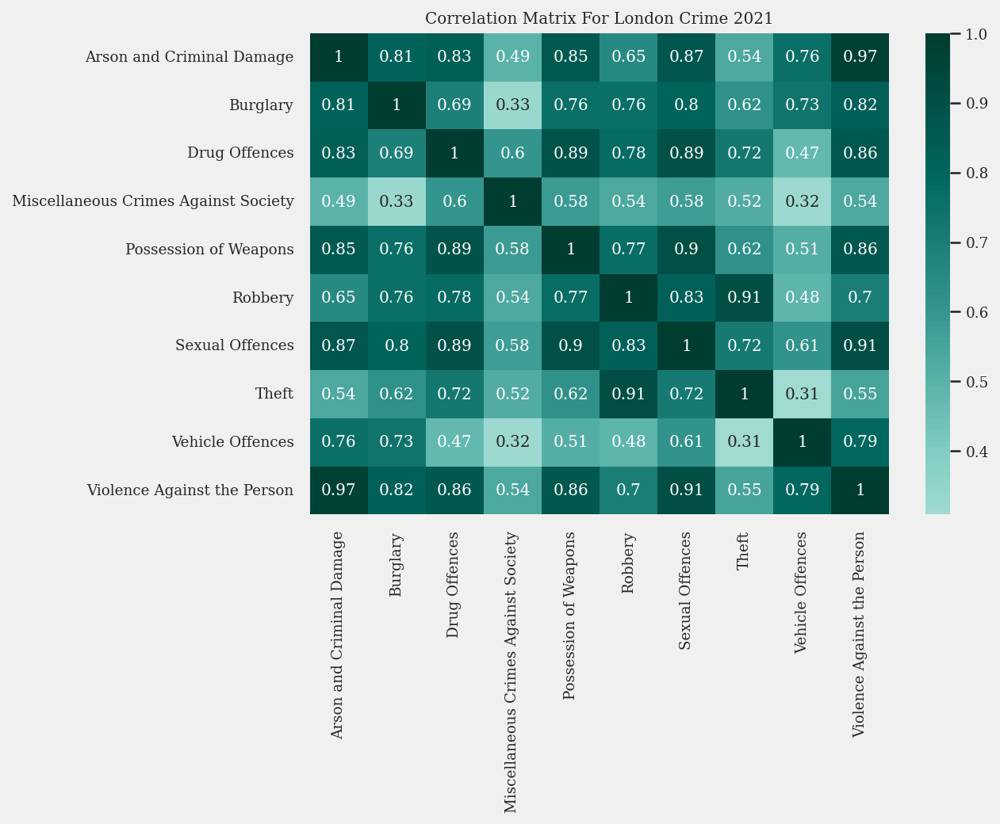

In [70]:
#create a figure to plot
plt.figure( dpi = 150,
           figsize=(7,5)
          )

#create a correlation matrix
corrMatrix = df_21.corr().round(3)

#relative size of the labels on the heatmap
sns.set( font_scale= 0.8 )
plt.rc('font', family='serif')


sns.heatmap( corrMatrix, annot = True , cmap = 'BrBG', center=0 )

#rotate the x and y tiks
plt.xticks( rotation = 90 )
plt.yticks( rotation = 0 )
plt.title("Correlation Matrix For London Crime 2021")
plt.show()


In [71]:
important_crime_types = [
     'Burglary', 'Drug Offences',
     'Sexual Offences',  'Theft',
]

Pre-process the data so that it can be clustered. 

In [72]:
from sklearn import preprocessing
df__ = df_21[important_crime_types]
df_standardized = preprocessing.scale( df_21[important_crime_types] )
df_standardized = pd.DataFrame( df_standardized )
df_standardized.head()
# center mean 

,0,1,2,3
0,-0.716759,0.316612,-0.211664,-0.646883
1,1.277315,-0.483823,0.043493,-0.147683
2,-1.437949,-0.773745,-1.030290,-0.907995
3,0.355056,0.923242,-0.147875,-0.085072
4,-0.188329,-0.422373,-0.612117,-0.235001


In [73]:
#create a list for the wcss parameter
wcss = []

#test with 14 clusters
for i in range(1, 15):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 11)
    kmeans.fit(df_standardized)
    wcss.append(kmeans.inertia_)
wcss

[132.0,
 67.64040516061524,
 44.43485020026633,
 29.38077244526063,
 20.293869041810684,
 15.46893429184741,
 12.478064387601213,
 10.800571394070936,
 8.79209211219195,
 7.447397436801358,
 6.117078204925793,
 5.003293055338619,
 4.222499278850891,
 3.793359748769671]

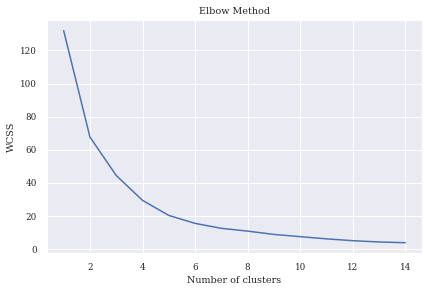

In [74]:
plt.plot(range(1, 15), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# 4 relevant clusters . 

In [75]:
X = df_standardized

prediction using k means clustering

In [76]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(X)
pred_y

array([1, 1, 0, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 0, 0, 1, 1, 1, 1, 0, 2, 1,
       0, 0, 2, 1, 0, 2, 0, 2, 1, 1, 3])

In [77]:
df__.head()

,Burglary,Drug Offences,Sexual Offences,Theft
0,1191,1613,660,3231
1,2391,1105,732,5009
2,757,921,429,2301
3,1836,1998,678,5232
4,1509,1144,547,4698


prediction using hierarchical clustering , we plot a dendrgram first to see how many clusters will be optimal for the data 

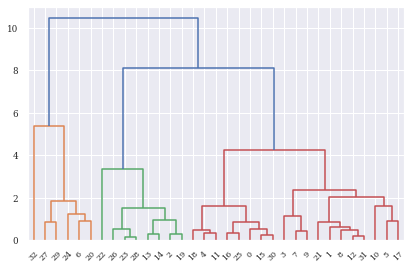

In [78]:
from  scipy.cluster import hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage( X, method="ward"))


In [79]:
cluster = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="ward")
pred_hc = cluster.fit_predict(X)
pred_hc

array([0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 2, 1, 0,
       2, 2, 1, 0, 2, 1, 2, 1, 0, 0, 3], dtype=int64)

prediction using DBSCAN

In [80]:
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=4, min_samples=8)


In [81]:
pred_db = dbscan.fit_predict(X)
pred_db

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1],
      dtype=int64)

notice the data seems to only have two unique alues . 

In [82]:
np.unique(pred_db)

array([-1,  0], dtype=int64)

In [83]:
df_21['cluster'] = pred_y
df_21['cluster_hc'] = pred_hc
df_21[ ['cluster', 'borough'] ].head()

,cluster,borough
0,1,Barking and Dagenham
1,1,Barnet
2,0,Bexley
3,1,Brent
4,1,Bromley


In [84]:
def convert_hc_cluster_number(hc_cluster_no):
    """
    Converts HC cluster number so the colors on the map can match each other as best as possible. 
    """
    # 0 , 1, 2
    # 2--- 0 
    # 1 --- 2
    # 0 -- 1
    if hc_cluster_no == 2: 
        return 0
    if hc_cluster_no == 1:
        return 2
    if hc_cluster_no == 0:
        return 1
    if hc_cluster_no == 3:
        return 3

In [102]:
a = df_21[df_21["cluster"] == 2]

a.describe()

,Arson and Criminal Damage,Burglary,Drug Offences,Miscellaneous Crimes Against Society,Possession of Weapons,Robbery,Sexual Offences,Theft,Vehicle Offences,Violence Against the Person,cluster,cluster_hc,id
count,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.0,6.000000,6.000000
mean,2095.166667,2231.000000,2240.000000,454.500000,306.000000,1129.000000,1059.666667,7800.166667,3403.666667,9542.166667,2.0,1.833333,18.666667
std,312.133572,320.090612,334.669389,89.959435,55.295569,188.559805,168.770456,1389.579421,581.812570,1151.519590,0.0,0.408248,11.910779
min,1657.000000,1695.000000,1620.000000,322.000000,250.000000,829.000000,858.000000,5351.000000,2730.000000,8165.000000,2.0,1.000000,2.000000
25%,1954.500000,2084.500000,2290.500000,393.250000,270.000000,1055.250000,935.750000,7435.500000,2947.250000,8729.000000,2.0,2.000000,11.250000
50%,2116.000000,2317.500000,2293.500000,482.000000,293.000000,1149.500000,1066.500000,8084.500000,3349.000000,9660.500000,2.0,2.000000,19.500000
75%,2167.250000,2483.750000,2297.250000,517.500000,325.000000,1214.500000,1132.750000,8740.250000,3846.750000,9923.000000,2.0,2.000000,28.500000
max,2597.000000,2510.000000,2645.000000,548.000000,402.000000,1386.000000,1320.000000,9103.000000,4168.000000,11338.000000,2.0,2.000000,31.000000


In [103]:
a

,borough,Arson and Criminal Damage,Burglary,Drug Offences,Miscellaneous Crimes Against Society,Possession of Weapons,Robbery,Sexual Offences,Theft,Vehicle Offences,Violence Against the Person,cluster,cluster_hc,id
6,Croydon,2597,2041,2298,548,330,829,1145,5351,4168,11338,2,2,2
10,Hackney,1657,2510,1620,322,268,1386,858,8756,3191,8165,2,1,29
20,Lambeth,2091,2215,2295,498,402,1231,1320,7422,2730,9659,2,2,11
24,Newham,2141,1695,2290,524,276,1165,1096,8693,3960,10010,2,2,31
27,Southwark,1909,2420,2292,369,310,1134,902,9103,2866,8419,2,2,12
29,Tower Hamlets,2176,2505,2645,466,250,1029,1037,7476,3507,9662,2,2,27


In [85]:
df_21['cluster_hc'] = df_21['cluster_hc'].apply(convert_hc_cluster_number)

In [86]:
df_21.head()

,borough,Arson and Criminal Damage,Burglary,Drug Offences,Miscellaneous Crimes Against Society,Possession of Weapons,Robbery,Sexual Offences,Theft,Vehicle Offences,Violence Against the Person,cluster,cluster_hc
0,Barking and Dagenham,1456,1191,1613,340,168,575,660,3231,2388,6902,1,1
1,Barnet,1808,2391,1105,393,148,615,732,5009,4950,7874,1,1
2,Bexley,1430,757,921,286,98,187,429,2301,2037,5353,0,0
3,Brent,2050,1836,1998,439,243,750,678,5232,3626,9089,1,1
4,Bromley,1820,1509,1144,362,161,381,547,4698,3543,6512,1,1


In [87]:
colours_cluster = ['#004777', '#A30000', '#FF7700',
                   '#F564A9', '#00AFB5']

In [88]:
import json
# boroughs_geo = json.load(open('london.json' ,"r"))
boroughs_geo = json.load(open('london_boroughs.json' ,"r"))



In [89]:
boroughs_map = {}
for feature in boroughs_geo["features"]:
    feature["id"] = feature["properties"]["id"]
    boroughs_map[feature["properties"]["name"]] = feature["id"]
    

In [90]:
boroughs_map

{'Kingston upon Thames': 1,
 'Croydon': 2,
 'Bromley': 3,
 'Hounslow': 4,
 'Ealing': 5,
 'Havering': 6,
 'Hillingdon': 7,
 'Harrow': 8,
 'Brent': 9,
 'Barnet': 10,
 'Lambeth': 11,
 'Southwark': 12,
 'Lewisham': 13,
 'Greenwich': 14,
 'Bexley': 15,
 'Enfield': 16,
 'Waltham Forest': 17,
 'Redbridge': 18,
 'Sutton': 19,
 'Richmond upon Thames': 20,
 'Merton': 21,
 'Wandsworth': 22,
 'Hammersmith and Fulham': 23,
 'Kensington and Chelsea': 24,
 'Westminster': 25,
 'Camden': 26,
 'Tower Hamlets': 27,
 'Islington': 28,
 'Hackney': 29,
 'Haringey': 30,
 'Newham': 31,
 'Barking and Dagenham': 32,
 'City of London': 33}

In [91]:
df_21["id"] = df_21["borough"].apply(lambda x: boroughs_map[x])

In [92]:
df_21

,borough,Arson and Criminal Damage,Burglary,Drug Offences,Miscellaneous Crimes Against Society,Possession of Weapons,Robbery,Sexual Offences,Theft,Vehicle Offences,Violence Against the Person,cluster,cluster_hc,id
0,Barking and Dagenham,1456,1191,1613,340,168,575,660,3231,2388,6902,1,1,32
1,Barnet,1808,2391,1105,393,148,615,732,5009,4950,7874,1,1,10
2,Bexley,1430,757,921,286,98,187,429,2301,2037,5353,0,0,15
3,Brent,2050,1836,1998,439,243,750,678,5232,3626,9089,1,1,9
4,Bromley,1820,1509,1144,362,161,381,547,4698,3543,6512,1,1,3
5,Camden,1662,1809,1367,277,137,1061,781,9725,2807,6457,1,1,26
6,Croydon,2597,2041,2298,548,330,829,1145,5351,4168,11338,2,2,2
7,Ealing,2009,1876,1676,470,180,638,892,4919,4498,9672,1,1,5
8,Enfield,1958,2135,1186,437,207,896,847,4683,5720,9043,1,1,16
9,Greenwich,1976,1661,1745,439,261,556,960,4673,3100,9128,1,1,14


In [93]:
import plotly.express as px

## Plot for K means clusters 

In [94]:
fig = px.choropleth_mapbox(
    df_21, locations="id", geojson=boroughs_geo, color="cluster" , hover_name="borough", hover_data=["cluster"],
    mapbox_style="carto-positron",
    center={"lat": 51.5 , "lon": 0},
    
    )

fig.show()

## Plot for HC Clusters

In [95]:
fig = px.choropleth_mapbox(
    df_21, locations="id", geojson=boroughs_geo, color="cluster_hc" , hover_name="borough", hover_data=["cluster_hc"],
    mapbox_style="carto-positron",
    center={"lat": 51.5 , "lon": 0},
    
    )

fig.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_14140\461152662.py:4: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.

C:\Users\HP\AppData\Local\Temp\ipykernel_14140\461152662.py:47: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



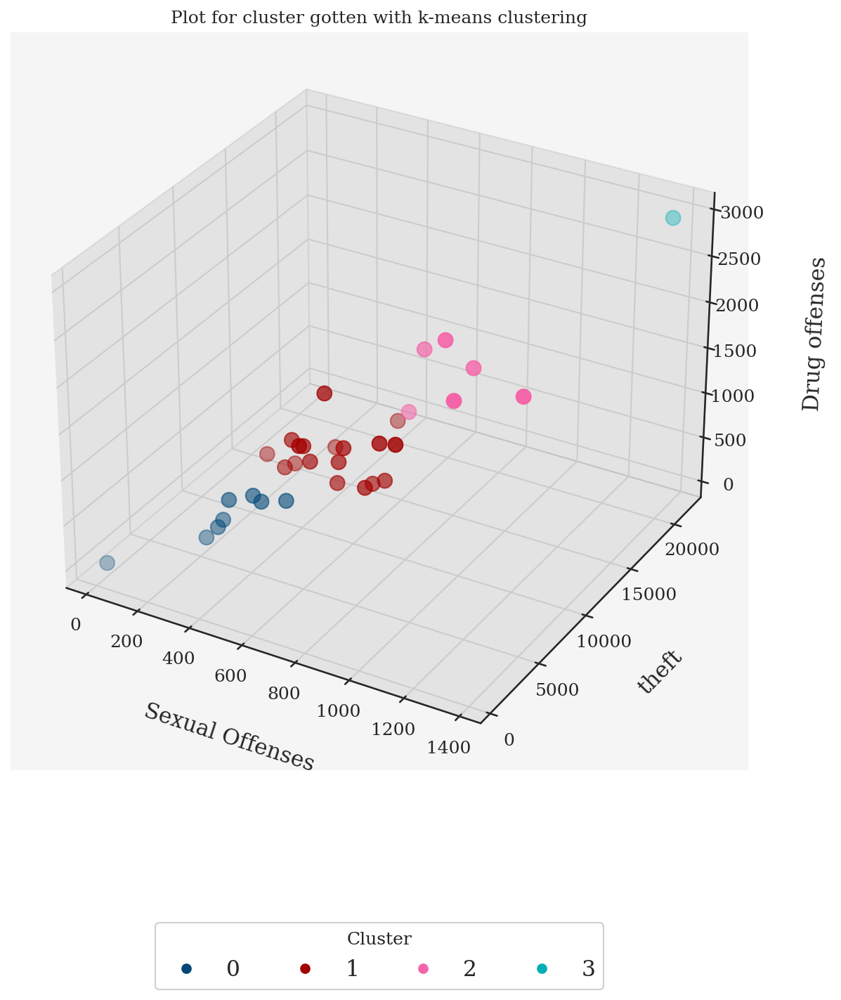

In [96]:
sns.set( style = 'white' )
plt.rc('font', family='serif')
_fig_ = plt.figure( figsize=(12.5, 7), dpi = 150 )
ax = Axes3D(_fig_)

backgroundColor = '#F5f5f5'

#color for the XYZ planes for the 3d plots
rgba_planes = (20/255, 20/255, 20/255)

ax.set_facecolor( backgroundColor )
ax.w_xaxis.set_pane_color( rgba_planes )
ax.w_yaxis.set_pane_color( rgba_planes )
ax.w_zaxis.set_pane_color( rgba_planes )
important_crime_types = [
     'Burglary', 'Drug Offences',
     'Robbery',  'Theft',
]
x = df_21['Sexual Offences']
y = df_21['Theft']
z = df_21['Drug Offences']
colours_for_clusters = df_21['cluster']

cmap_clusters = matplotlib.colors.ListedColormap(colours_cluster)

g=ax.scatter(x, y, z, s=100,  c =  colours_for_clusters  , cmap=cmap_clusters  )

ax.set_xlabel('Sexual Offenses',
             labelpad = 20,
             size = 15,
             )
ax.set_ylabel('theft',
             labelpad = 20,
             size = 15,
             )
ax.set_zlabel('Drug offenses',
             labelpad = 25,
             size = 15,
             )

ax.tick_params( axis = 'x', labelsize = 12 )
ax.tick_params( axis = 'y', labelsize = 12 )
ax.tick_params( axis = 'z', labelsize = 12 )
legend = ax.legend(*g.legend_elements(), loc="lower center", prop = {'size':15},title="Cluster",
                   borderaxespad=-10, ncol=4)
ax.add_artist(legend)
ax.grid(b = True)
ax.set_title("Plot for cluster gotten with k-means clustering")
plt.show()

C:\Users\HP\AppData\Local\Temp\ipykernel_14140\2505564075.py:4: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.

C:\Users\HP\AppData\Local\Temp\ipykernel_14140\2505564075.py:47: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



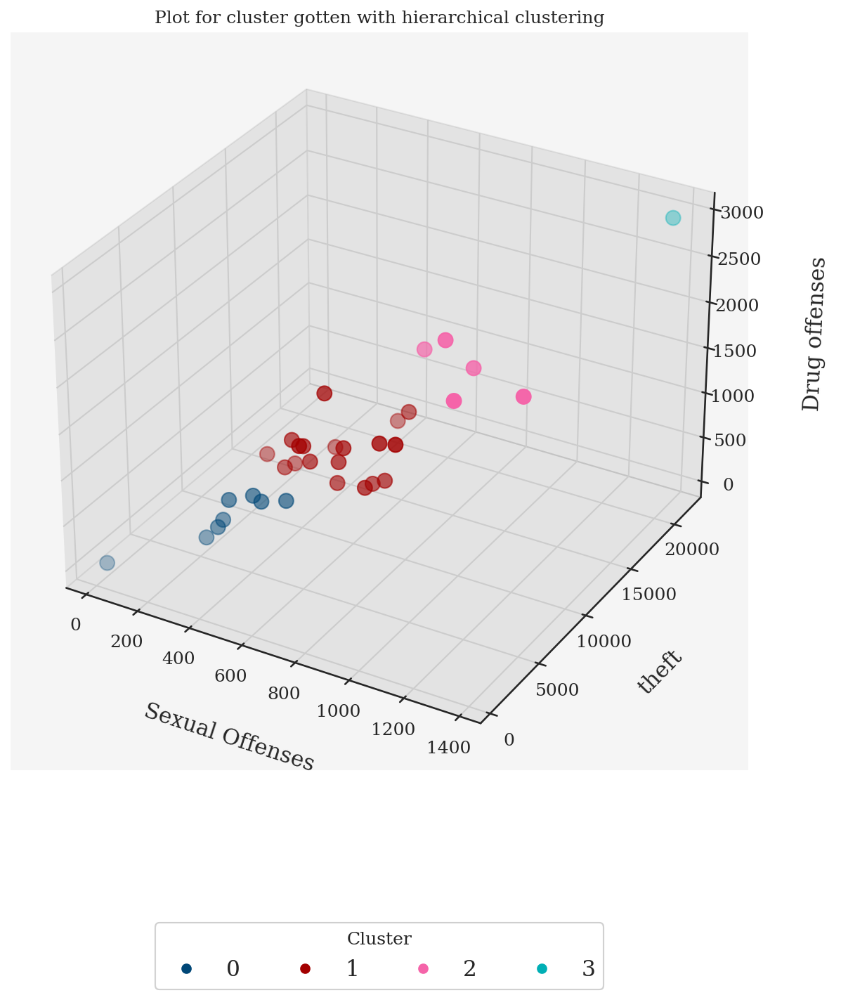

In [98]:
sns.set( style = 'white' )
plt.rc('font', family='serif')
_fig_ = plt.figure( figsize=(12.5, 7), dpi = 150 )
ax = Axes3D(_fig_)

backgroundColor = '#F5f5f5'

#color for the XYZ planes for the 3d plots
rgba_planes = (20/255, 20/255, 20/255)

ax.set_facecolor( backgroundColor )
ax.w_xaxis.set_pane_color( rgba_planes )
ax.w_yaxis.set_pane_color( rgba_planes )
ax.w_zaxis.set_pane_color( rgba_planes )
important_crime_types = [
     'Burglary', 'Drug Offences',
     'Robbery',  'Theft',
]
x = df_21['Sexual Offences']
y = df_21['Theft']
z = df_21['Drug Offences']
colours_for_clusters = df_21['cluster_hc']

cmap_clusters = matplotlib.colors.ListedColormap(colours_cluster)

g=ax.scatter(x, y, z, s=100,  c =  colours_for_clusters  , cmap=cmap_clusters  )

ax.set_xlabel('Sexual Offenses',
             labelpad = 20,
             size = 15,
             )
ax.set_ylabel('theft',
             labelpad = 20,
             size = 15,
             )
ax.set_zlabel('Drug offenses',
             labelpad = 25,
             size = 15,
             )

ax.tick_params( axis = 'x', labelsize = 12 )
ax.tick_params( axis = 'y', labelsize = 12 )
ax.tick_params( axis = 'z', labelsize = 12 )
legend = ax.legend(*g.legend_elements(), loc="lower center", prop = {'size':15},title="Cluster",
                   borderaxespad=-10, ncol=4)
ax.add_artist(legend)
ax.grid(b = True)
ax.set_title("Plot for cluster gotten with hierarchical clustering")
plt.show()